In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/csiro-biomass/sample_submission.csv
/kaggle/input/csiro-biomass/train.csv
/kaggle/input/csiro-biomass/test.csv
/kaggle/input/csiro-biomass/test/ID1001187975.jpg
/kaggle/input/csiro-biomass/train/ID2099464826.jpg
/kaggle/input/csiro-biomass/train/ID2037861084.jpg
/kaggle/input/csiro-biomass/train/ID1211362607.jpg
/kaggle/input/csiro-biomass/train/ID1853508321.jpg
/kaggle/input/csiro-biomass/train/ID193102215.jpg
/kaggle/input/csiro-biomass/train/ID698608346.jpg
/kaggle/input/csiro-biomass/train/ID1859251563.jpg
/kaggle/input/csiro-biomass/train/ID1880764911.jpg
/kaggle/input/csiro-biomass/train/ID853954911.jpg
/kaggle/input/csiro-biomass/train/ID1403107574.jpg
/kaggle/input/csiro-biomass/train/ID1781353117.jpg
/kaggle/input/csiro-biomass/train/ID384648061.jpg
/kaggle/input/csiro-biomass/train/ID1563418511.jpg
/kaggle/input/csiro-biomass/train/ID2125100696.jpg
/kaggle/input/csiro-biomass/train/ID482555369.jpg
/kaggle/input/csiro-biomass/train/ID638711343.jpg
/kaggle/input/c

In [3]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split

print("TensorFlow:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2025-11-26 01:10:22.512168: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764119422.924186      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764119423.051881      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

TensorFlow: 2.18.0
Num GPUs Available:  2


In [4]:
df = pd.read_csv("/kaggle/input/csiro-biomass/train.csv")

# We need to pivot on 'image_path' (or sample_id) and 'target_name'
pivot_df = df.pivot_table(index='image_path', columns='target_name', values='target').reset_index()
target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
pivot_df = pivot_df[['image_path'] + target_cols]

# train test split 17:3 ratio 
train_df, val_df = train_test_split(pivot_df, test_size=0.15, random_state=42)


In [5]:
# # Create TensorFlow Dataset
# IMG_SIZE = 412
# BATCH_SIZE = 8

# def load_image(path):
#     # Expand on this function MORE (image pre-processing here)
#     img = tf.io.read_file("/kaggle/input/csiro-biomass/" + path)
#     img = tf.image.decode_jpeg(img, channels=3)
#     img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
#     img = tf.cast(img, tf.float32) / 255.0  
#     return img


In [6]:
# Create TensorFlow Dataset
IMG_SIZE = 380
BATCH_SIZE = 8


# ------------------- COLOR FEATURES -------------------

def to_hsv(img):
    return tf.image.rgb_to_hsv(img)  # 3ch


def to_lab(img):
    # Efficient RGB→LAB approx
    def rgb_to_lab(x):
        # linearize
        mask = tf.cast(x > 0.04045, tf.float32)
        x = ((x + 0.055) / 1.055)**2.4 * mask + (x / 12.92) * (1 - mask)

        # RGB→XYZ
        M = tf.constant([
            [0.4124, 0.3576, 0.1805],
            [0.2126, 0.7152, 0.0722],
            [0.0193, 0.1192, 0.9505]
        ], tf.float32)
        x = tf.tensordot(x, M, axes=1)

        # Normalize by D65
        x = x / tf.constant([0.95047, 1.0, 1.08883], tf.float32)

        eps = 0.008856
        k   = 903.3

        def f(t):
            return tf.where(t > eps, t**(1/3), (k * t + 16) / 116)

        fx = f(x[..., 0])
        fy = f(x[..., 1])
        fz = f(x[..., 2])

        L = 116 * fy - 16
        A = 500 * (fx - fy)
        B = 200 * (fy - fz)
        return tf.stack([L, A, B], axis=-1)

    return rgb_to_lab(img)


def to_gray(img):
    return tf.image.rgb_to_grayscale(img)  # 1ch


# ------------------- VEGETATION INDICES -------------------

def ndvi_approx(img):
    r, g = img[...,0], img[...,1]
    nd = (g - r) / (g + r + 1e-6)
    return nd[..., None]


def exg(img):
    r, g, b = img[...,0], img[...,1], img[...,2]
    return (2*g - r - b)[..., None]


def vari(img):
    r, g, b = img[...,0], img[...,1], img[...,2]
    return ((g - r) / (g + r - b + 1e-6))[..., None]


def gli(img):
    r, g, b = img[...,0], img[...,1], img[...,2]
    return ((2*g - r - b) / (2*g + r + b + 1e-6))[..., None]


def cive(img):
    r, g, b = img[...,0], img[...,1], img[...,2]
    return (0.441*r - 0.811*g + 0.385*b + 18.787)[..., None]


# ------------------- TEXTURE FEATURES -------------------
def sobel_edges(img):
    gray = tf.image.rgb_to_grayscale(img)        # (H,W,1)
    gray4 = tf.expand_dims(gray, axis=0)         # (1,H,W,1)
    sob = tf.image.sobel_edges(gray4)            # (1,H,W,1,2)
    sob = tf.squeeze(sob, axis=0)                # (H,W,1,2)
    sob = tf.squeeze(sob, axis=2)                # (H,W,2)
    return sob


def laplacian(img):
    gray = tf.image.rgb_to_grayscale(img)        # (H,W,1)
    gray4 = tf.expand_dims(gray, axis=0)         # expand to 4D

    k = tf.constant([[0, 1, 0],
                     [1,-4, 1],
                     [0, 1, 0]], tf.float32)
    k = k[..., None, None]                       # (3,3,1,1)

    lap = tf.nn.conv2d(gray4, k, strides=1, padding="SAME")
    lap = tf.squeeze(lap, axis=0)                # back to (H,W,1)
    return lap


def gradient_mag(img):
    sob = sobel_edges(img)                       # (H,W,2)
    gx, gy = sob[...,0], sob[...,1]
    mag = tf.sqrt(gx*gx + gy*gy)
    return mag[..., None]                        # (H,W,1)

# ------------------- STRUCTURE FEATURES -------------------

def local_entropy(img):
    # entropy on grayscale using a 5x5 patch
    gray = tf.image.rgb_to_grayscale(img)
    patches = tf.image.extract_patches(
        images=tf.expand_dims(gray, 0),
        sizes=[1,5,5,1],
        strides=[1,1,1,1],
        rates=[1,1,1,1],
        padding="SAME"
    )
    patches = tf.squeeze(patches, 0)
    patches = tf.reshape(patches, (*gray.shape[:2], 25))

    # compute entropy
    eps = 1e-8
    p = patches / (tf.reduce_sum(patches, axis=-1, keepdims=True) + eps)
    ent = -tf.reduce_sum(p * tf.math.log(p + eps), axis=-1)
    return ent[..., None]  # 1ch


# ------------------- MAIN LOADER -------------------

def load_image(path):
    img = tf.io.read_file("/kaggle/input/csiro-biomass/" + path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32) / 255.0

    # Compute all features
    hsv  = to_hsv(img)
    lab  = to_lab(img)
    gray = to_gray(img)

    nd  = ndvi_approx(img)
    eg  = exg(img)
    va  = vari(img)
    gl  = gli(img)
    ci  = cive(img)

    sob = sobel_edges(img)
    lap = laplacian(img)
    mag = gradient_mag(img)

    ent = local_entropy(img)

    # Concatenate all channels
    out = tf.concat([
        img,        # 3
        hsv,        # 3
        lab,        # 3
        gray,       # 1
        nd, eg, va, gl, ci,   # 5
        sob,        # 2
        lap,        # 1
        mag,        # 1
        ent         # 1
    ], axis=-1)

    return out


In [7]:
import matplotlib.pyplot as plt

def create_dataset(dataframe, batch_size=BATCH_SIZE, shuffle=False):
    image_paths = dataframe['image_path'].values
    targets = dataframe[target_cols].values.astype(np.float32)

    ds = tf.data.Dataset.from_tensor_slices((image_paths, targets))

    def map_func(path, target):
        return load_image(path), target

    ds = ds.map(map_func, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        ds = ds.shuffle(buffer_size=1000)

    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds


# creating tensorflow dataset
train_ds = create_dataset(train_df, shuffle=True)
val_ds = create_dataset(val_df, shuffle=False)


I0000 00:00:1764119444.677154      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1764119444.677845      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [8]:
import matplotlib.pyplot as plt
import tensorflow as tf

def show_features(img_tensor):
    # Downscale for faster rendering (optional)
    small = tf.image.resize(img_tensor, (256, 256))

    features = [
        ("ORIGINAL RGB", small[..., :3]),
        ("HSV - H", small[..., 3:4]),
        ("HSV - S", small[..., 4:5]),
        ("HSV - V", small[..., 5:6]),
        ("LAB - L", small[..., 6:7]),
        ("LAB - A", small[..., 7:8]),
        ("LAB - B", small[..., 8:9]),
        ("Grayscale", small[..., 9:10]),
        ("NDVI", small[..., 10:11]),
        ("ExG", small[..., 11:12]),
        ("VARI", small[..., 12:13]),
        ("GLI", small[..., 13:14]),
        ("CIVE", small[..., 14:15]),
        ("Sobel X", small[..., 15:16]),
        ("Sobel Y", small[..., 16:17]),
        ("Laplacian", small[..., 17:18]),
        ("Gradient Mag", small[..., 18:19]),
    ]

    cols = 4
    rows = (len(features) + cols - 1) // cols

    plt.figure(figsize=(14, rows * 3))

    for i, (title, fmap) in enumerate(features):
        ax = plt.subplot(rows, cols, i+1)

        # RGB has 3 channels → show in color
        if fmap.shape[-1] == 3:
            plt.imshow(fmap.numpy())
        else:
            plt.imshow(fmap[..., 0].numpy(), cmap="gray")

        plt.title(title, fontsize=9)
        plt.axis("off")

    plt.tight_layout()
    plt.show()




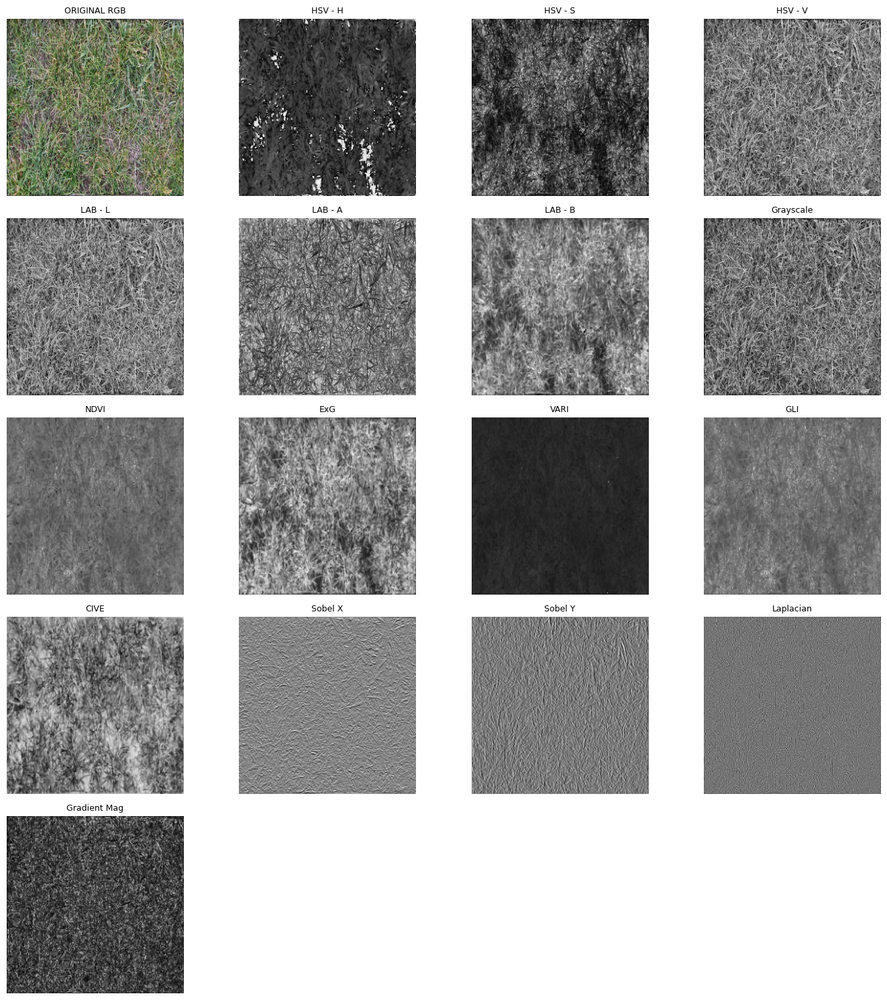

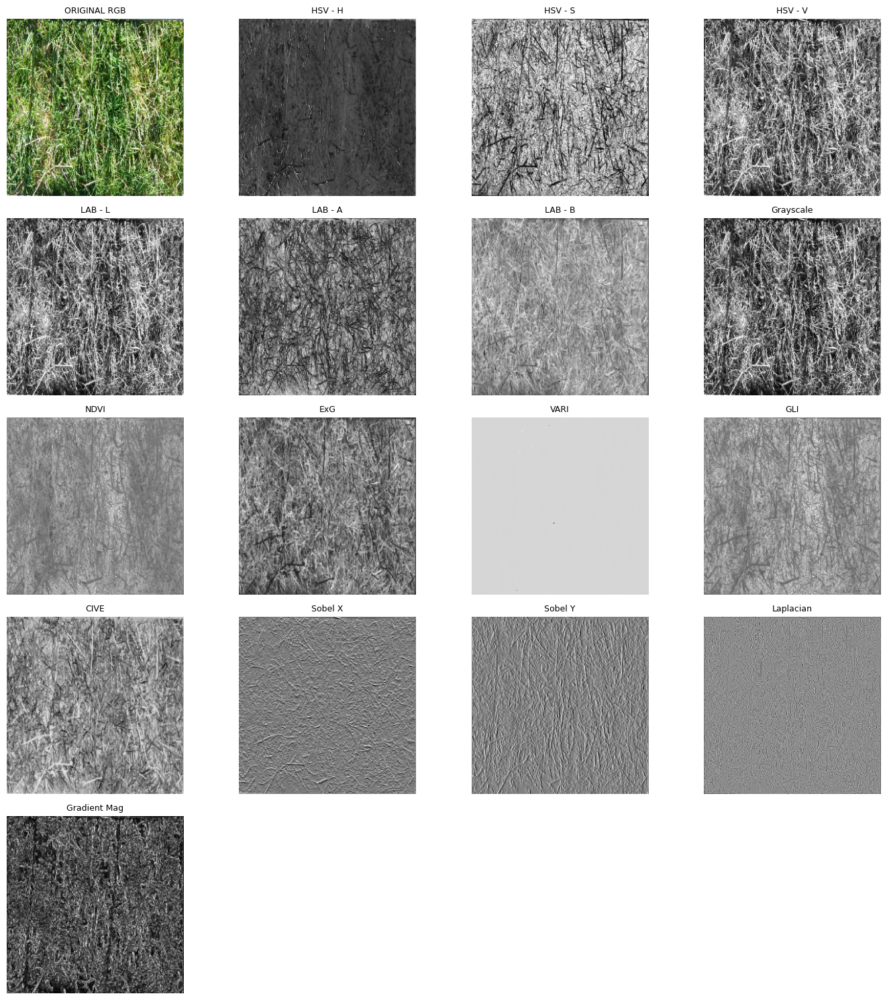

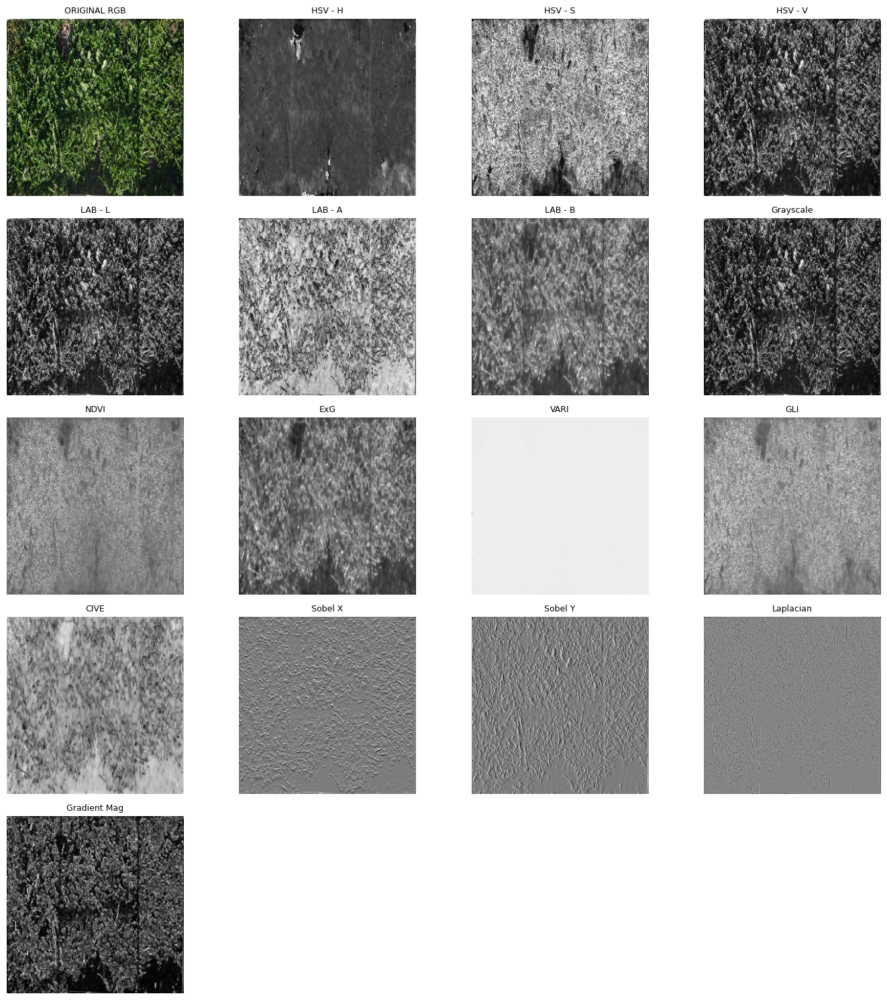

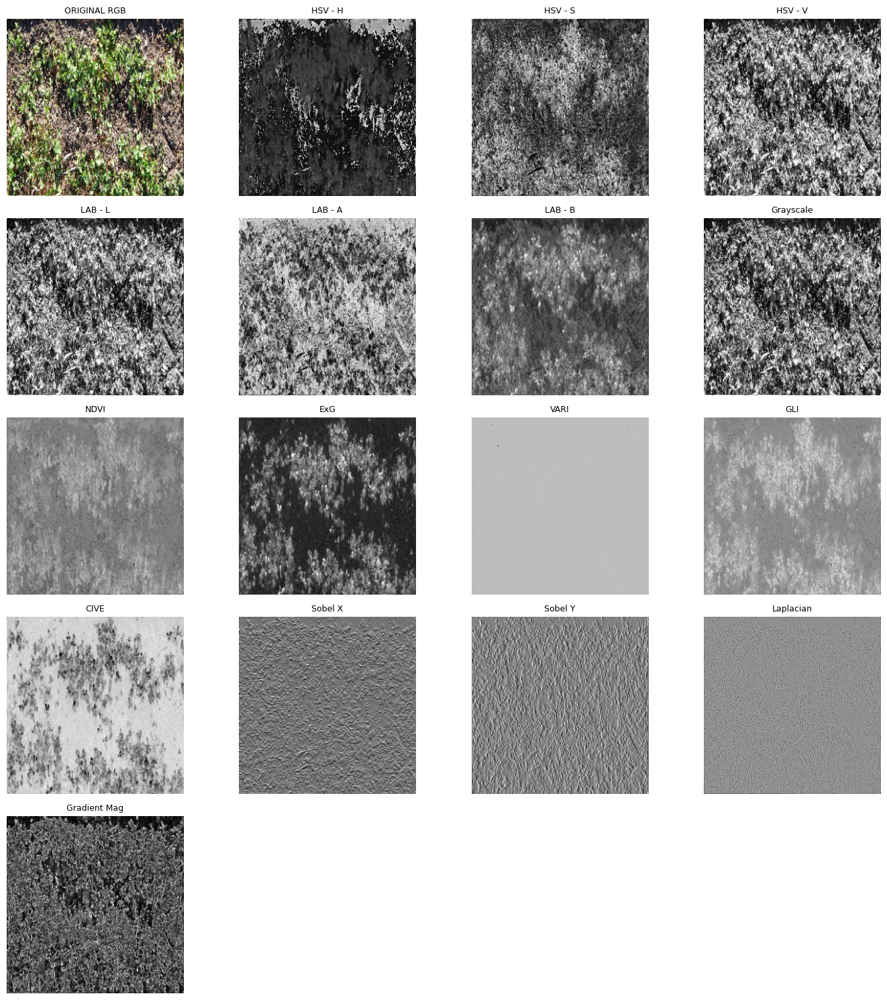

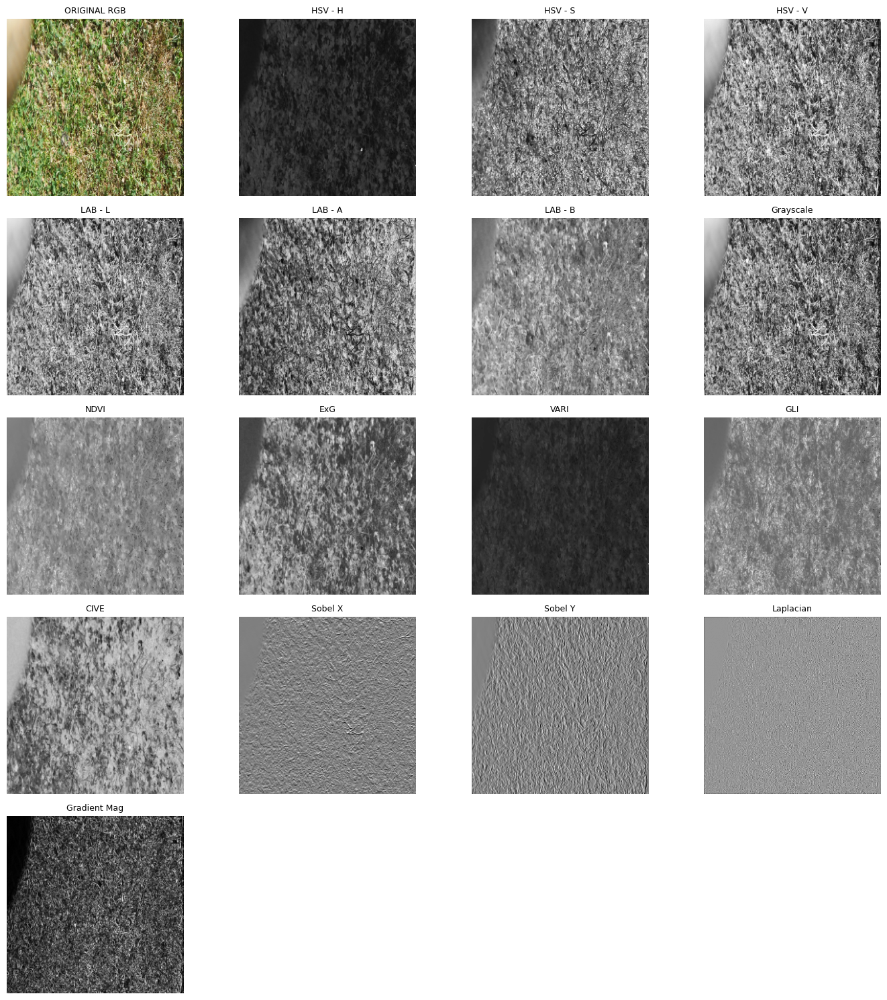

In [9]:
for img_batch, target_batch in train_ds.take(5):
    show_features(img_batch[0])

## BUILDING THE MODEL NOW

In [10]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Conv2D, BatchNormalization, ReLU, Add, GlobalAveragePooling2D,
    Dense, Dropout, Input, Reshape, Multiply, MaxPooling2D
)
from tensorflow.keras.models import Model


# ------------------------------------------------------------
# Squeeze-Excitation (SE)
# ------------------------------------------------------------
def se_block(x, reduction=16):
    channels = x.shape[-1]
    se = GlobalAveragePooling2D()(x)
    se = Dense(max(channels // reduction, 4), activation="relu")(se)
    se = Dense(channels, activation="sigmoid")(se)
    se = Reshape((1, 1, channels))(se)
    return Multiply()([x, se])


# ------------------------------------------------------------
# Bottleneck Block (ResNet-50/101/152 family)
# ------------------------------------------------------------
def bottleneck_block(x, filters, stride=1):
    shortcut = x

    # 1x1 reduce
    y = Conv2D(filters, 1, strides=1, padding="same", use_bias=False)(x)
    y = BatchNormalization()(y)
    y = ReLU()(y)

    # 3x3 conv
    y = Conv2D(filters, 3, strides=stride, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)
    y = ReLU()(y)

    # 1x1 expand
    y = Conv2D(filters * 4, 1, strides=1, padding="same", use_bias=False)(y)
    y = BatchNormalization()(y)

    # shortcut alignment
    if stride != 1 or shortcut.shape[-1] != filters * 4:
        shortcut = Conv2D(filters * 4, 1, strides=stride, padding="same", use_bias=False)(shortcut)
        shortcut = BatchNormalization()(shortcut)

    # SE inside bottleneck
    y = se_block(y)

    out = Add()([shortcut, y])
    out = ReLU()(out)
    return out


# ------------------------------------------------------------
# Stage builder
# ------------------------------------------------------------
def make_stage(x, filters, blocks, stride):
    # First block (possibly downsampling)
    x = bottleneck_block(x, filters, stride)
    # Remaining blocks
    for _ in range(blocks - 1):
        x = bottleneck_block(x, filters, 1)
    return x


# ------------------------------------------------------------
# FINAL MODEL: SE-ResNet-101
# ------------------------------------------------------------
def build_improved_model(img_size=512):
    inputs = Input((img_size, img_size, CHANNELS))

    # ----- STEM -----
    x = Conv2D(64, 7, strides=2, padding="same", use_bias=False)(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = MaxPooling2D(pool_size=3, strides=2, padding="same")(x)

    # ----- RESNET-101 STAGES -----
    x = make_stage(x, 64, 3, stride=1)     # conv2_x
    x = make_stage(x, 128, 4, stride=2)    # conv3_x
    x = make_stage(x, 256, 23, stride=2)   # conv4_x (VERY HEAVY)
    x = make_stage(x, 512, 3, stride=2)    # conv5_x

    # Extra SE at top
    x = se_block(x)

    # ----- HEAD -----
    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation="relu")(x)
    x = Dropout(0.30)(x)

    x = Dense(512, activation="relu")(x)
    x = Dropout(0.20)(x)

    x = Dense(256, activation="relu")(x)

    # Final regression outputs (float32 for mixed precision)
    outputs = Dense(5, dtype="float32")(x)

    model = Model(inputs, outputs)
    return model


# ---- Instantiate Model ----
IMG_SIZE = 380  # change freely; 384 or 448 recommended for ResNet-101
CHANNELS = 20
model = build_improved_model(IMG_SIZE)
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 380, 380,  │          0 │ -                 │
│ (InputLayer)        │ 20)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 190, 190,  │     62,720 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 190, 190,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 190, 190,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 95, 95,    │          0 │ re_lu[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 95, 95,    │      4,096 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 95, 95,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 95, 95,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 95, 95,    │     36,864 │ re_lu_1[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 95, 95,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 95, 95,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 95, 95,    │     16,384 │ re_lu_2[0][0]     │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 95, 95,    │      1,024 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 256)       │          0 │ batch_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 16)        │      4,112 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │      4,352 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 95, 95,    │     16,384 │ max_pooling2d[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 50,718,581 (193.48 MB)

 Trainable params: 50,613,237 (193.07 MB)

 Non-trainable params: 105,344 (411.50 KB)

In [11]:
# model arch 
from tensorflow.keras.utils import plot_model
from IPython.display import Image, display

# plot_model(model, to_file="/home/vector/project/CSIRO---Image2Biomass-Prediction/model.png", show_shapes=True, show_layer_names=True)

# Image is wayy too long, working on notebook becomes difficult

# we will assign weights to the output parameters

In [12]:
import tensorflow.keras.backend as K

def weighted_r2(y_true, y_pred):
    weights = tf.constant([0.1, 0.1, 0.1, 0.2, 0.5], dtype=tf.float32)
    mean_y_true = K.mean(y_true, axis=0)
    tss = K.sum(K.square(y_true - mean_y_true), axis=0)
    rss = K.sum(K.square(y_true - y_pred), axis=0)
    r2_scores = 1 - (rss / (tss + K.epsilon()))
    return K.sum(r2_scores * weights)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='mae',
    metrics=['mae', weighted_r2]
)


In [17]:
# Callbacks


checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'best_model.keras', 
    monitor='val_loss', 
    mode='min',
    save_best_only=True, 
    verbose=1
)
# early_stopping = tf.keras.callbacks.EarlyStopping(
#     monitor='val_weighted_r2', 
#     mode='max', 
#     patience=10, 
#     restore_best_weights=True,
#     verbose=1
# )

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[checkpoint, reduce_lr]
)


Epoch 1/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 513ms/step - loss: 14.8680 - mae: 14.8680 - weighted_r2: -0.2794
Epoch 1: val_loss improved from inf to 22.45018, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 55s 751ms/step - loss: 14.8418 - mae: 14.8418 - weighted_r2: -0.2801 - val_loss: 22.4502 - val_mae: 22.4502 - val_weighted_r2: -2.2879 - learning_rate: 1.0000e-04
Epoch 2/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - loss: 13.1298 - mae: 13.1298 - weighted_r2: -0.5225
Epoch 2: val_loss improved from 22.45018 to 21.45242, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 56s 782ms/step - loss: 13.1392 - mae: 13.1392 - weighted_r2: -0.5207 - val_loss: 21.4524 - val_mae: 21.4524 - val_weighted_r2: -2.0098 - learning_rate: 1.0000e-04
Epoch 3/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - loss: 13.1381 - mae: 13.1381 - weighted_r2: -1.5349
Epoch 3: val_loss did not improve from 21.45242
38/38 ━━━━━━━━━━━━━━━━━━━━ 52s 692ms/step - loss: 13.1383 - mae: 13.1383 - weighted_r

KeyboardInterrupt: 

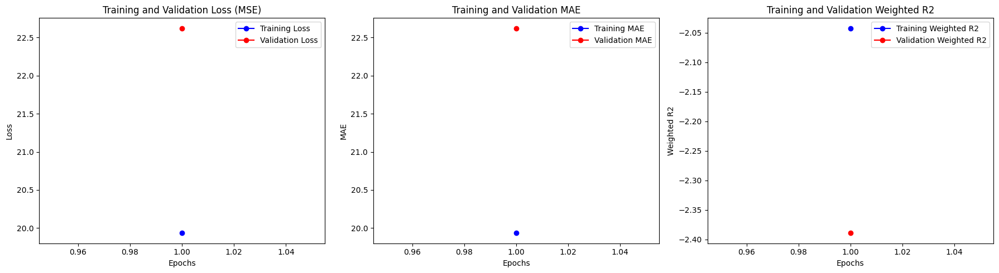

In [18]:
import matplotlib.pyplot as plt

def plot_history(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    mae = history.history['mae']
    val_mae = history.history['val_mae']
    r2 = history.history['weighted_r2']
    val_r2 = history.history['val_weighted_r2']
    
    epochs = range(1, len(loss) + 1)
    
    plt.figure(figsize=(18, 5))
    
    # Plot Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss (MSE)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plot MAE
    plt.subplot(1, 3, 2)
    plt.plot(epochs, mae, 'bo-', label='Training MAE')
    plt.plot(epochs, val_mae, 'ro-', label='Validation MAE')
    plt.title('Training and Validation MAE')
    plt.xlabel('Epochs')
    plt.ylabel('MAE')
    plt.legend()
    
    # Plot Weighted R2
    plt.subplot(1, 3, 3)
    plt.plot(epochs, r2, 'bo-', label='Training Weighted R2')
    plt.plot(epochs, val_r2, 'ro-', label='Validation Weighted R2')
    plt.title('Training and Validation Weighted R2')
    plt.xlabel('Epochs')
    plt.ylabel('Weighted R2')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

plot_history(history)


In [ ]:
# model.save("model7_v5.h5")    

Generating predictions for validation set...

Overall Weighted R2 Score: -0.0404
Component R2 Scores:
  Dry_Green_g    : -0.0118
  Dry_Dead_g     : -0.2555
  Dry_Clover_g   : 0.0541
  GDM_g          : 0.2042
  Dry_Total_g    : -0.1198

Visualizing 5 random samples...


TypeError: Invalid shape (380, 380, 20) for image data

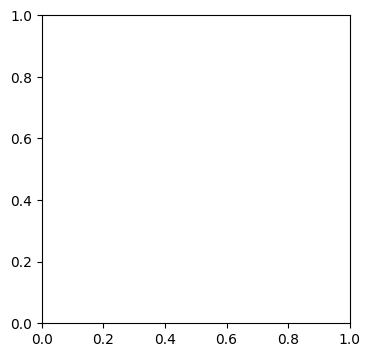

In [20]:
import matplotlib.pyplot as plt
import numpy as np

def evaluate_and_visualize(model, val_ds, num_samples=5):
    # 1. Get all predictions and true values
    all_images = []
    all_targets = []
    all_preds = []
    
    print("Generating predictions for validation set...")
    # Unbatch the /kaggle/input/csiro-biomass to process all samples
    for images, targets in val_ds:
        preds = model.predict(images, verbose=0)
        all_images.append(images.numpy())
        all_targets.append(targets.numpy())
        all_preds.append(preds)
        
    # Concatenate batches
    all_images = np.concatenate(all_images, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    all_preds = np.concatenate(all_preds, axis=0)
    
    # 2. Calculate Overall Weighted R2
    weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5])
    
    mean_true = np.mean(all_targets, axis=0)
    tss = np.sum((all_targets - mean_true)**2, axis=0)
    rss = np.sum((all_targets - all_preds)**2, axis=0)
    
    # Avoid division by zero
    r2_scores = 1 - (rss / (tss + 1e-7))
    weighted_r2 = np.sum(r2_scores * weights)
    
    print(f"\nOverall Weighted R2 Score: {weighted_r2:.4f}")
    print(f"Component R2 Scores:")
    target_names = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
    for name, score in zip(target_names, r2_scores):
        print(f"  {name:<15}: {score:.4f}")
        
    # 3. Visualize Samples
    print(f"\nVisualizing {num_samples} random samples...")
    indices = np.random.choice(len(all_images), num_samples, replace=False)
    
    for idx in indices:
        img = all_images[idx]
        true = all_targets[idx]
        pred = all_preds[idx]
        
        plt.figure(figsize=(12, 4))
        
        # Image
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title("Input Image")
        
        # Table of values
        plt.subplot(1, 2, 2)
        plt.axis('off')
        
        # Header
        text_str = f"{'Component':<15} | {'True':>6} | {'Pred':>6} | {'Diff':>6}\n"
        text_str += "-"*45 + "\n"
        
        # Rows
        for i, name in enumerate(target_names):
            diff = pred[i] - true[i]
            text_str += f"{name:<15} | {true[i]:6.1f} | {pred[i]:6.1f} | {diff:6.1f}\n"
            
        plt.text(0, 0.5, text_str, fontsize=12, family='monospace', va='center')
        plt.tight_layout()
        plt.show()

# Run evaluation
evaluate_and_visualize(model, val_ds)


In [21]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os

def generate_submission(model):
    print("Loading test data...")
    test_df = pd.read_csv("/kaggle/input/csiro-biomass/test.csv")
    
    # Get unique images to predict on
    unique_images = test_df['image_path'].unique()
    print(f"Found {len(unique_images)} unique test images.")
    
    # Create /kaggle/input/csiro-biomass
    def load_image(path):
        # Check if path exists
        full_path = "/kaggle/input/csiro-biomass/" + path
        img = tf.io.read_file(full_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
        img = tf.cast(img, tf.float32) / 255.0
        return img

    test_ds = tf.data.Dataset.from_tensor_slices(unique_images)
    test_ds = test_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    
    print("Predicting...")
    # Predict
    predictions = model.predict(test_ds, verbose=1)
    
    # Map predictions to image paths
    # predictions shape: (N_images, 5)
    # Target order: ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
    target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
    
    # Create a lookup dictionary: image_path -> {target_name: value}
    pred_dict = {}
    for img_path, pred_row in zip(unique_images, predictions):
        pred_dict[img_path] = {col: val for col, val in zip(target_cols, pred_row)}
        
    print("Formatting submission...")
    # Create submission rows
    submission_rows = []
    for index, row in test_df.iterrows():
        img_path = row['image_path']
        target_name = row['target_name']
        sample_id = row['sample_id']
        
        # Get prediction
        if img_path in pred_dict:
            pred_value = pred_dict[img_path][target_name]
        else:
            # Fallback if something went wrong (shouldn't happen)
            pred_value = 0.0
        
        # Ensure non-negative (biomass can't be negative)
        pred_value = max(0.0, pred_value)
        
        submission_rows.append({'sample_id': sample_id, 'target': pred_value})
        
    submission_df = pd.DataFrame(submission_rows)
    
    # Save to CSV
    output_file = "submission.csv"
    submission_df.to_csv(output_file, index=False)
    print(f"Saved submission to {output_file}")
    
    # Print the content for user to copy if needed
    print("\n" + "="*20 + " SUBMISSION CSV CONTENT " + "="*20)
    print(submission_df.to_csv(index=False))
    print("="*64)

# Run generation
generate_submission(model)


Loading test data...
Found 1 unique test images.
Predicting...


InvalidArgumentError: Graph execution error:

Detected at node convolution defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 211, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "/tmp/ipykernel_47/3604926665.py", line 75, in <cell line: 0>

  File "/tmp/ipykernel_47/3604926665.py", line 30, in generate_submission

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 562, in predict

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 259, in one_step_on_data_distributed

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 249, in one_step_on_data

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 104, in predict_step

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py", line 908, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py", line 182, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph

  File "/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py", line 637, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py", line 908, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py", line 243, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py", line 233, in convolution_op

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py", line 1305, in conv

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 329, in conv

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 317, in _conv_xla

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 304, in _conv

Depth of input must be a multiple of depth of filter: 3 vs 20

Stack trace for op definition: 
File "<frozen runpy>", line 198, in _run_module_as_main
File "<frozen runpy>", line 88, in _run_code
File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>
File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance
File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start
File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 211, in start
File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever
File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once
File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run
File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue
File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one
File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell
File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request
File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute
File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell
File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell
File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell
File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner
File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async
File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes
File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
File "/tmp/ipykernel_47/3604926665.py", line 75, in <cell line: 0>
File "/tmp/ipykernel_47/3604926665.py", line 30, in generate_submission
File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 562, in predict
File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 259, in one_step_on_data_distributed
File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 249, in one_step_on_data
File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 104, in predict_step
File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py", line 908, in __call__
File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__
File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler
File "/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py", line 182, in call
File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph
File "/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py", line 637, in call
File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py", line 908, in __call__
File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__
File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler
File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py", line 243, in call
File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py", line 233, in convolution_op
File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py", line 1305, in conv
File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 329, in conv
File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 317, in _conv_xla
File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 304, in _conv

	 [[{{node convolution}}]]
	tf2xla conversion failed while converting __inference_one_step_on_data_177489[]. Run with TF_DUMP_GRAPH_PREFIX=/path/to/dump/dir and --vmodule=xla_compiler=2 to obtain a dump of the compiled functions.
	 [[StatefulPartitionedCall]] [Op:__inference_one_step_on_data_distributed_178820]